# Object detection with Tensorflow object detection API

In [ ]:
# ONLY IF YOU HAVE SOME MANY RESTART SESSION
%reset -f
import os
os.kill(os.getpid(), 9)

In [1]:
# Install core GPU runtime deps TensorFlow 2.15 needs
!apt-get update -y
!apt-get install -y --no-install-recommends \
    cuda-command-line-tools-12-2 \
    cuda-cupti-12-2 \
    libcudnn8=8.9.4.25-1+cuda12.2 \
    libcudnn8-dev=8.9.4.25-1+cuda12.2 \
    libcusparse-dev-12-2

# Clean remnants
!rm -rf /content/sample_data


Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,632 B]
Get:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Get:3 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ Packages [75.2 kB]
Get:4 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Hit:5 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:6 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:7 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Get:10 https://r2u.stat.illinois.edu/ubuntu jammy/main amd64 Packages [2,695 kB]
Hit:11 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:12 http://security.ubuntu.com/ubuntu jammy-security/main amd64 Packages [2,788 kB]
Get:13 https://developer.download.nvidia.com/compute/c

In [2]:
# Check GPU (you should see NVIDIA L4 or similar)
!nvidia-smi

Sun Apr 20 16:20:48 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA L4                      Off |   00000000:00:03.0 Off |                    0 |
| N/A   46C    P8             13W /   72W |       0MiB /  23034MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

## Installation

In [3]:
# 2. TensorFlow 2.15 + matching Keras + tf-slim + Protobuf
!pip install --upgrade pip
!pip install tensorflow==2.15.0 keras==2.15.0 tf-slim protobuf==3.20.*

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 70.2 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 24.1.2
    Uninstalling pip-24.1.2:
      Successfully uninstalled pip-24.1.2
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.3/475.3 MB 51.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 84.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 57.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 139.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 152.4 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.17.2
    Uninstalling wrapt-1.17.2:
      Successfully uninstalled wrapt-1.17.2
  Attempting uninstall: protobuf
    Found existing installation: protobuf 5.29.4
    Uninstalling protobuf-5.29.4:
      Successfully uninstalled protobuf-5.29.4
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.

**IMPORTANT**: Please restart the runtime for the changes to take effect. You can either click the `Restart Runtime` button in the output of the cell above, or go to `Runtime > Restart Session` on the Menu bar above.

You'll start by installing the Tensorflow 2 [Object Detection API](https://github.com/tensorflow/models/tree/master/research/object_detection).

In [1]:
# 3. Clone the models repo
%cd /content
!git clone https://github.com/tensorflow/models.git
%cd models/research


/content
Cloning into 'models'...
remote: Enumerating objects: 99739, done.
remote: Counting objects: 100% (81/81), done.
remote: Compressing objects: 100% (41/41), done.
remote: Total 99739 (delta 58), reused 40 (delta 40), pack-reused 99658 (from 4)
Receiving objects: 100% (99739/99739), 626.61 MiB | 17.04 MiB/s, done.
Resolving deltas: 100% (72587/72587), done.
/content/models/research


In [2]:
# 4. Compile protobufs
!protoc object_detection/protos/*.proto --python_out=.

In [3]:
# 5. Install the Object Detection API properly
!cp object_detection/packages/tf2/setup.py .
!python -m pip install .

Processing /content/models/research
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of tf-keras to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 51.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.5/17.5 MB 140.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.6/49.6 MB 114.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.5/3.5 MB 97.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 129.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 130.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.8/40.8 MB 147.5

In [4]:
# yes run this again and restart
!pip install tensorflow==2.15.0 keras==2.15.0 tf-slim protobuf==3.20.*

  Using cached tensorflow-2.15.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (4.4 kB)
  Using cached keras-2.15.0-py3-none-any.whl.metadata (2.4 kB)
  Using cached protobuf-3.20.3-py2.py3-none-any.whl.metadata (720 bytes)
  Using cached ml_dtypes-0.2.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (20 kB)
  Using cached tensorboard-2.15.2-py3-none-any.whl.metadata (1.7 kB)
Using cached tensorflow-2.15.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (475.3 MB)
Using cached keras-2.15.0-py3-none-any.whl (1.7 MB)
Using cached protobuf-3.20.3-py2.py3-none-any.whl (162 kB)
Using cached ml_dtypes-0.2.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (1.0 MB)
Using cached tensorboard-2.15.2-py3-none-any.whl (5.5 MB)
  Attempting uninstall: protobuf
    Found existing installation: protobuf 5.29.4
    Uninstalling protobuf-5.29.4:
      Successfully uninstalled protobuf-5.29.4
  Attempting uninstall: ml-dtypes
    Found exis

**IMPORTANT**: Please restart the runtime for the changes to take effect. You can either click the `Restart Runtime` button in the output of the cell above, or go to `Runtime > Restart Session` on the Menu bar above.

In [2]:
!cp /content/tfexample_decoder.py /usr/local/lib/python3.11/dist-packages/tf_slim/data/tfexample_decoder.py


In [3]:
!head -n 20 /usr/local/lib/python3.11/dist-packages/tf_slim/data/tfexample_decoder.py


# coding=utf-8
# Copyright 2016 The TensorFlow Authors. All Rights Reserved.
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.
# ==============================================================================
"""Contains the TFExampleDecoder its associated helper classes.

The TFExampleDecode is a DataDecoder used to decode TensorFlow Example protos.
In order to do so each requested item must be paired with one or more Example
features that are parsed to produce the Tensor-based manifestation of the 

In [4]:
# Remove broken estimator import
!sed -i '/from tensorflow.compat.v1 import estimator as tf_estimator/d' object_detection/inputs.py
!sed -i '/import tensorflow_estimator as tf_estimator/d' object_detection/inputs.py


sed: can't read object_detection/inputs.py: No such file or directory
sed: can't read object_detection/inputs.py: No such file or directory


## Imports

Let's now import the packages you will use in this assignment.

In [5]:
import tensorflow as tf
print("🧠 TF version:", tf.__version__)
print("✅ GPU:", tf.config.list_physical_devices('GPU'))

🧠 TF version: 2.15.0
✅ GPU: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [6]:
#import tensorflow as tf
from object_detection.utils import label_map_util, config_util
from object_detection import model_lib_v2

print("✅ TensorFlow version:", tf.__version__)
print("✅ GPU devices:", tf.config.list_physical_devices('GPU'))
print("✅ Object Detection API loaded successfully!")


✅ TensorFlow version: 2.15.0
✅ GPU devices: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
✅ Object Detection API loaded successfully!


In [7]:
import matplotlib
import matplotlib.pyplot as plt

import os
import random
import zipfile
import io
import scipy.misc
import numpy as np

import glob
import imageio
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display, Javascript
from IPython.display import Image as IPyImage

try:
  # %tensorflow_version only exists in Colab.
  %tensorflow_version 2.x
except Exception:
  pass

import tensorflow as tf
tf.get_logger().setLevel('ERROR')

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.


In [ ]:
print(f"TensorFlow Version: {tf.__version__}")

## Roboflow data

In [8]:
# Install and set up Roboflow
!pip install roboflow
from roboflow import Roboflow
rf = Roboflow(api_key="3zX0IiVPf7UfB1zBmrKv")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 139.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 149.4 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.11.0.86
    Uninstalling opencv-python-headless-4.11.0.86:
      Successfully uninstalled opencv-python-headless-4.11.0.86
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tf-models-official 2.19.1 requires tensorflow~=2.19.0, but you have tensorflow 2.15.0 which is incompatible.


In [9]:
# Load dataset
workspace = rf.workspace("ssdcctv")
project = workspace.project("my-first-project-nwbay")
dataset = project.version(1).download("tfrecord")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to My-First-Project-1 in tfrecord:: 100%|██████████| 11/11 [00:01<00:00,  5.59it/s]


In [10]:
# Define dataset paths
dataset_location = dataset.location
train_data_path = os.path.join(dataset_location, "train", "objects.tfrecord")
val_data_path = os.path.join(dataset_location, "valid", "objects.tfrecord")
label_map_path = os.path.join(dataset_location, "train", "objects_label_map.pbtxt")
test_data_path = os.path.join(dataset_location, "test", "objects.tfrecord")

In [11]:
# Load label map
categories = label_map_util.create_category_index_from_labelmap(label_map_path, use_display_name=True)
num_classes = len(categories)

## pipeline configuration

In [12]:
# Change the chosen_model variable to deploy different models available in the TF2 object detection zoo
chosen_model = 'ssd-mobilenet-v2'

MODELS_CONFIG = {
    'ssd-mobilenet-v2': {
        'model_name': 'ssd_mobilenet_v2_320x320_coco17_tpu-8',
        'base_pipeline_file': 'ssd_mobilenet_v2_320x320_coco17_tpu-8.config',
        'pretrained_checkpoint': 'ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz',
    },
    'efficientdet-d0': {
        'model_name': 'efficientdet_d0_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d0_512x512_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d0_coco17_tpu-32.tar.gz',
    },
    'ssd-mobilenet-v2-fpnlite-320': {
        'model_name': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8',
        'base_pipeline_file': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config',
        'pretrained_checkpoint': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz',
    },
    'ssd_resnet50_v1': {
        'model_name': 'ssd_resnet50_v1_fpn_640x640_coco17_tpu-8',
        'base_pipeline_file': 'ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.config',
        'pretrained_checkpoint': 'ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz',
    }
}

model_name = MODELS_CONFIG[chosen_model]['model_name']
pretrained_checkpoint = MODELS_CONFIG[chosen_model]['pretrained_checkpoint']
base_pipeline_file = MODELS_CONFIG[chosen_model]['base_pipeline_file']

In [13]:
# Create "mymodel" folder for holding pre-trained weights and configuration files
%mkdir /content/models/mymodel/
%cd /content/models/mymodel/

# Download pre-trained model weights
import tarfile
download_tar = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/' + pretrained_checkpoint
!wget {download_tar}
tar = tarfile.open(pretrained_checkpoint)
tar.extractall()
tar.close()

# Download training configuration file for model
download_config = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/' + base_pipeline_file
!wget {download_config}

/content/models/mymodel
--2025-04-20 16:38:11--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 142.251.175.207, 74.125.24.207, 142.251.10.207, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|142.251.175.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 46042990 (44M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz’

ssd_mobilenet_v2_32 100%[===================>]  43.91M  19.5MB/s    in 2.3s    

2025-04-20 16:38:13 (19.5 MB/s) - ‘ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz’ saved [46042990/46042990]

--2025-04-20 16:38:14--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_mobilenet_v2_320x320_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ..

In [14]:
# Set training parameters for the model
num_steps = 40000

if chosen_model == 'efficientdet-d0':
  batch_size = 4
else:
  batch_size = 16

In [15]:
# Set file locations
pipeline_fname = '/content/models/mymodel/' + base_pipeline_file
fine_tune_checkpoint = '/content/models/mymodel/' + model_name + '/checkpoint/ckpt-0'

In [16]:
# Create custom configuration file by writing the dataset, model checkpoint, and training parameters into the base pipeline file
import re

%cd /content/models/mymodel
print('writing custom configuration file')

with open(pipeline_fname) as f:
    s = f.read()
with open('pipeline_file.config', 'w') as f:

    # Set fine_tune_checkpoint path
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)

    # Set tfrecord files for train and test datasets
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 'input_path: "{}"'.format(train_data_path), s)
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 'input_path: "{}"'.format(val_data_path), s)

    # Set label_map_path
    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_path), s)

    # Set batch_size
    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(num_steps), s)

    # Set number of classes num_classes
    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)

    # Change fine-tune checkpoint type from "classification" to "detection"
    s = re.sub(
        'fine_tune_checkpoint_type: "classification"', 'fine_tune_checkpoint_type: "{}"'.format('detection'), s)

    # If using ssd-mobilenet-v2, reduce learning rate (because it's too high in the default config file)
    if chosen_model == 'ssd-mobilenet-v2':
      s = re.sub('learning_rate_base: .8',
                 'learning_rate_base: .08', s)

      s = re.sub('warmup_learning_rate: 0.13333',
                 'warmup_learning_rate: .026666', s)

    # If using efficientdet-d0, use fixed_shape_resizer instead of keep_aspect_ratio_resizer (because it isn't supported by TFLite)
    if chosen_model == 'efficientdet-d0':
      s = re.sub('keep_aspect_ratio_resizer', 'fixed_shape_resizer', s)
      s = re.sub('pad_to_max_dimension: true', '', s)
      s = re.sub('min_dimension', 'height', s)
      s = re.sub('max_dimension', 'width', s)

    f.write(s)

/content/models/mymodel
writing custom configuration file


In [17]:
# (Optional) Display the custom configuration file's contents
!cat /content/models/mymodel/pipeline_file.config

# SSD with Mobilenet v2
# Trained on COCO17, initialized from Imagenet classification checkpoint
# Train on TPU-8
#
# Achieves 22.2 mAP on COCO17 Val

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 8
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      ssd_anchor_generator {
        num_layers: 6
        min_scale: 0.2
        max_scale: 0.95
        aspect_ratios: 1.0
        aspect_ratios: 2.0
        aspect_ratios: 0.5
        aspect_ratios: 3.0
 

In [18]:
# Set the path to the custom config file and the directory to store training checkpoints in
pipeline_file = '/content/models/mymodel/pipeline_file.config'
model_dir = '/content/training/'

## Training

In [19]:
%reload_ext tensorboard
%tensorboard --logdir '/content/training/train'

<IPython.core.display.Javascript object>

In [20]:
!python /content/models/research/object_detection/model_main_tf2.py \
  --pipeline_config_path="/content/models/mymodel/pipeline_file.config" \
  --model_dir="/content/training/" \
  --alsologtostderr \
  --num_train_steps=40000 \
  --sample_1_of_n_eval_examples=1


2025-04-20 16:39:03.351931: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-04-20 16:39:03.351991: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-04-20 16:39:03.353119: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-20 16:39:04.557716: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2025-04-20 16:39:07.730345: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
INFO:tensorflow:Using Mir

## Export model inference graph

In [21]:
# === Export the model ===
!python /content/models/research/object_detection/exporter_main_v2.py \
    --input_type image_tensor \
    --pipeline_config_path="/content/models/mymodel/pipeline_file.config" \
    --trained_checkpoint_dir="/content/training" \
    --output_directory="/content/models/my_model/exported_model"


2025-04-20 17:31:50.581905: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-04-20 17:31:50.581953: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-04-20 17:31:50.583355: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-20 17:31:51.746761: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2025-04-20 17:31:54.810940: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
Instructions for updating

In [22]:
import shutil

# Zip the exported model
export_dir = '/content/models/my_model/exported_model'
zip_path = '/content/models/my_model/model_SSD_Mobilenetv2_40000_l4.zip'

shutil.make_archive(zip_path.replace('.zip', ''), 'zip', export_dir)


'/content/models/my_model/model_SSD_Mobilenetv2_40000_l4.zip'

In [23]:
from google.colab import files

# Download the .zip file
files.download(zip_path)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Test Trained model with test image

In [24]:
import six
import time
from object_detection.utils import ops as utils_ops
from object_detection.utils import visualization_utils as vis_util

In [25]:
%matplotlib inline
import matplotlib.pyplot as plt


In [26]:
# Load the exported SavedModel
model_dir = "/content/models/my_model/exported_model/saved_model"
detect_fn = tf.saved_model.load(model_dir)

In [27]:
#not used?
def load_image_into_numpy_array(path):
    img_data = tf.io.gfile.GFile(path, 'rb').read()
    image = Image.open(BytesIO(img_data)).convert("RGB")
    return np.array(image)


In [28]:
category_index = label_map_util.create_category_index_from_labelmap(label_map_path, use_display_name=True)

In [29]:
#not used?
def run_inference_for_single_image(model, image):
  image = np.asarray(image)
  # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
  input_tensor = tf.convert_to_tensor(image)
  # The model expects a batch of images, so add an axis with `tf.newaxis`.
  input_tensor = input_tensor[tf.newaxis,...]

  # Run inference
  model_fn = model.signatures['serving_default']
  output_dict = model_fn(input_tensor)

  # All outputs are batches tensors.
  # Convert to numpy arrays, and take index [0] to remove the batch dimension.
  # We're only interested in the first num_detections.
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy()
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections

  # detection_classes should be ints.
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)

  # Handle models with masks:
  if 'detection_masks' in output_dict:
    # Reframe the the bbox mask to the image size.
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
              output_dict['detection_masks'], output_dict['detection_boxes'],
               image.shape[0], image.shape[1])
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                       tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()

  return output_dict

In [30]:
# Helper to load and display image with predictions
def show_inference(model, image_path):
    image_np = image_tensor.numpy() if tf.is_tensor(image_tensor) else image_tensor
    output_dict = run_inference_for_single_image(model, image_np)

    # Visualization of the results of a detection.
    vis_util.visualize_boxes_and_labels_on_image_array(
        image_np,
        output_dict['detection_boxes'],
        output_dict['detection_classes'],
        output_dict['detection_scores'],
        category_index,
        use_normalized_coordinates=True,
        max_boxes_to_draw=10,
        min_score_thresh=0.3,
        agnostic_mode=False)

    plt.figure(figsize=(12,8))
    plt.imshow(image_np)
    plt.axis('off')
    plt.show()

In [31]:
# Run inference on test images
test_images_folder = os.path.join(dataset_location, "test")
image_files = [os.path.join(test_images_folder, f) for f in os.listdir(test_images_folder) if f.endswith(".jpg") or f.endswith(".png")]

In [32]:
# Show predictions for a few test images
for image_path in image_files[:5]:
    print(f"Running inference on: {image_path}")
    show_inference(detect_fn, image_path)

In [33]:
def parse_tfrecord(example):
    features = {
        'image/height': tf.io.FixedLenFeature([], tf.int64),
        'image/width': tf.io.FixedLenFeature([], tf.int64),
        'image/filename': tf.io.FixedLenFeature([], tf.string),
        'image/encoded': tf.io.FixedLenFeature([], tf.string),
        'image/format': tf.io.FixedLenFeature([], tf.string),
        'image/object/bbox/xmin': tf.io.VarLenFeature(tf.float32),
        'image/object/bbox/xmax': tf.io.VarLenFeature(tf.float32),
        'image/object/bbox/ymin': tf.io.VarLenFeature(tf.float32),
        'image/object/bbox/ymax': tf.io.VarLenFeature(tf.float32),
        'image/object/class/text': tf.io.VarLenFeature(tf.string),
        'image/object/class/label': tf.io.VarLenFeature(tf.int64),
    }
    return tf.io.parse_single_example(example, features)

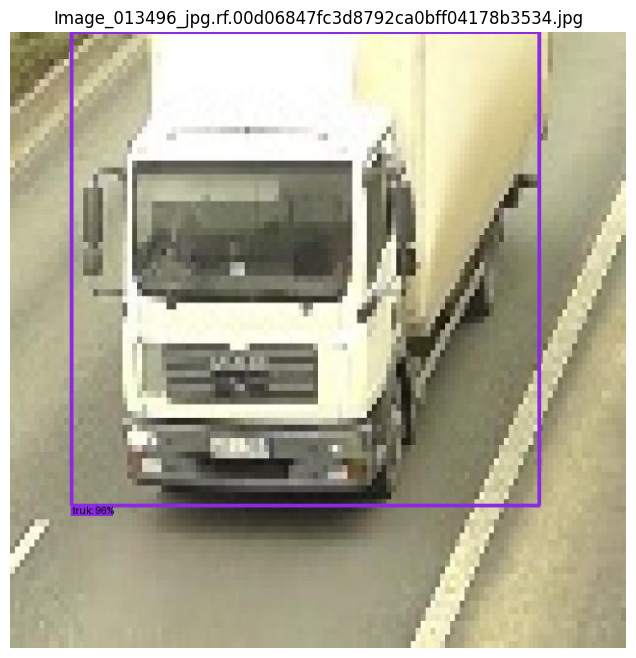

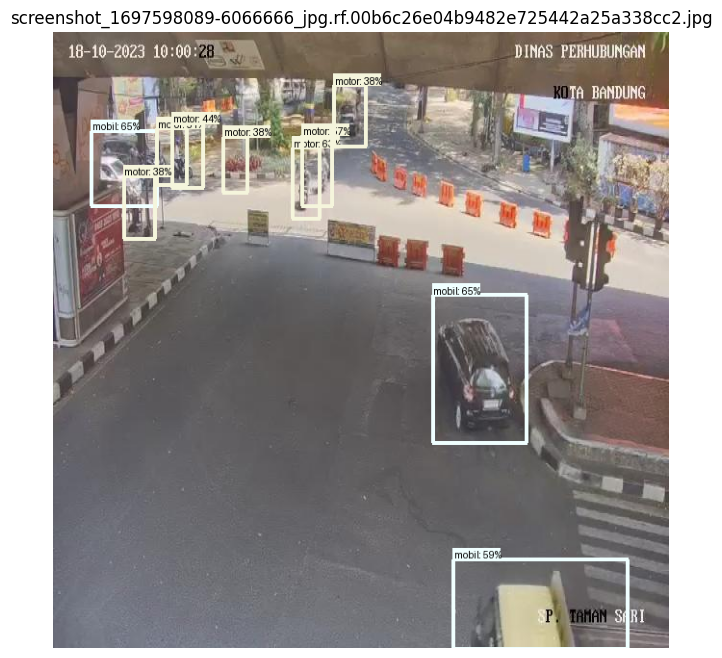

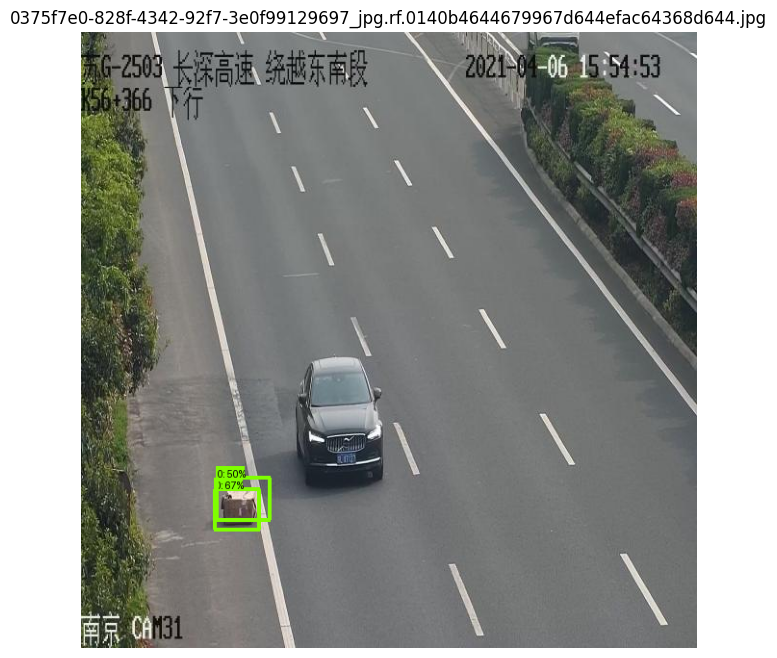

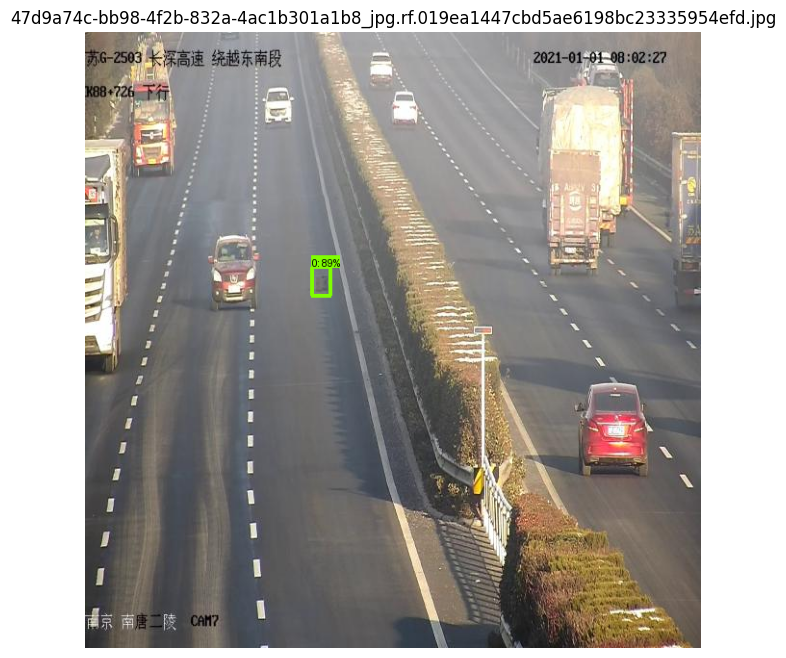

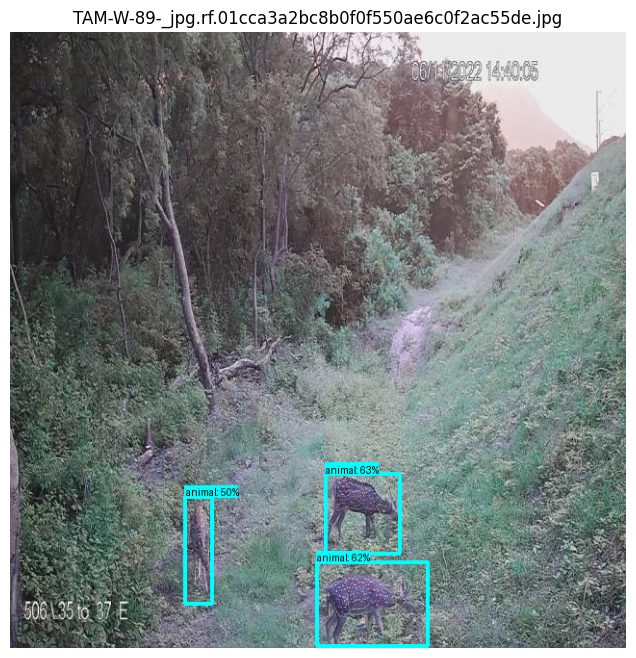

In [34]:
from PIL import ImageDraw

def run_model_on_roboflow_tfrecord(tfrecord_path, model, num_images=5):
    dataset = tf.data.TFRecordDataset(tfrecord_path)
    dataset = dataset.map(parse_tfrecord)

    for i, record in enumerate(dataset.take(num_images)):
        image_bytes = record['image/encoded'].numpy()
        image = Image.open(io.BytesIO(image_bytes)).convert("RGB")
        image_np = np.array(image)

        # Run inference
        output_dict = run_inference_for_single_image(model, image_np)

        # Visualization
        vis_util.visualize_boxes_and_labels_on_image_array(
            image_np,
            output_dict['detection_boxes'],
            output_dict['detection_classes'],
            output_dict['detection_scores'],
            category_index,
            use_normalized_coordinates=True,
            max_boxes_to_draw=10,
            min_score_thresh=0.3,
            agnostic_mode=False)

        plt.figure(figsize=(8, 8))
        plt.imshow(image_np)
        plt.axis('off')
        plt.title(record['image/filename'].numpy().decode('utf-8'))
        plt.show()

# Run it on test TFRecord
run_model_on_roboflow_tfrecord(test_data_path, detect_fn, num_images=5)


In [35]:
def run_inference_and_show(image_path):
    image_np = load_image_into_numpy_array(image_path)
    input_tensor = tf.convert_to_tensor(image_np)[tf.newaxis, ...]

    detections = detect_fn(input_tensor)

    # Process results
    num_detections = int(detections.pop('num_detections'))
    detections = {k: v[0, :num_detections].numpy()
                  for k, v in detections.items()}
    detections['num_detections'] = num_detections
    detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

    # Visualize results
    image_with_detections = image_np.copy()
    vis_util.visualize_boxes_and_labels_on_image_array(
        image_with_detections,
        detections['detection_boxes'],
        detections['detection_classes'],
        detections['detection_scores'],
        category_index,
        use_normalized_coordinates=True,
        max_boxes_to_draw=20,
        min_score_thresh=0.4,
        agnostic_mode=False)

    plt.figure(figsize=(10, 10))
    plt.imshow(image_with_detections)
    plt.axis('off')
    plt.show()

In [36]:
import os
import tensorflow as tf
from PIL import Image
import io

# Set TFRecord and output path
tfrecord_path = '/content/My-First-Project-1/test/objects.tfrecord'
output_dir = '/content/extracted_test_images'
os.makedirs(output_dir, exist_ok=True)

# Define the TFRecord schema
def parse_tfrecord2(example):
    features = {
        'image/encoded': tf.io.FixedLenFeature([], tf.string),
        'image/filename': tf.io.FixedLenFeature([], tf.string),
    }
    return tf.io.parse_single_example(example, features)

# Read and extract images
raw_dataset = tf.data.TFRecordDataset(tfrecord_path)
parsed_dataset = raw_dataset.map(parse_tfrecord2)

for i, parsed_record in enumerate(parsed_dataset):
    img_bytes = parsed_record['image/encoded'].numpy()
    filename = parsed_record['image/filename'].numpy().decode('utf-8')
    image = Image.open(io.BytesIO(img_bytes)).convert("RGB")
    image.save(os.path.join(output_dir, filename))

    if i >= 10:  # Save only 5 images for now
        break

print("✅ Saved extracted images to:", output_dir)


✅ Saved extracted images to: /content/extracted_test_images


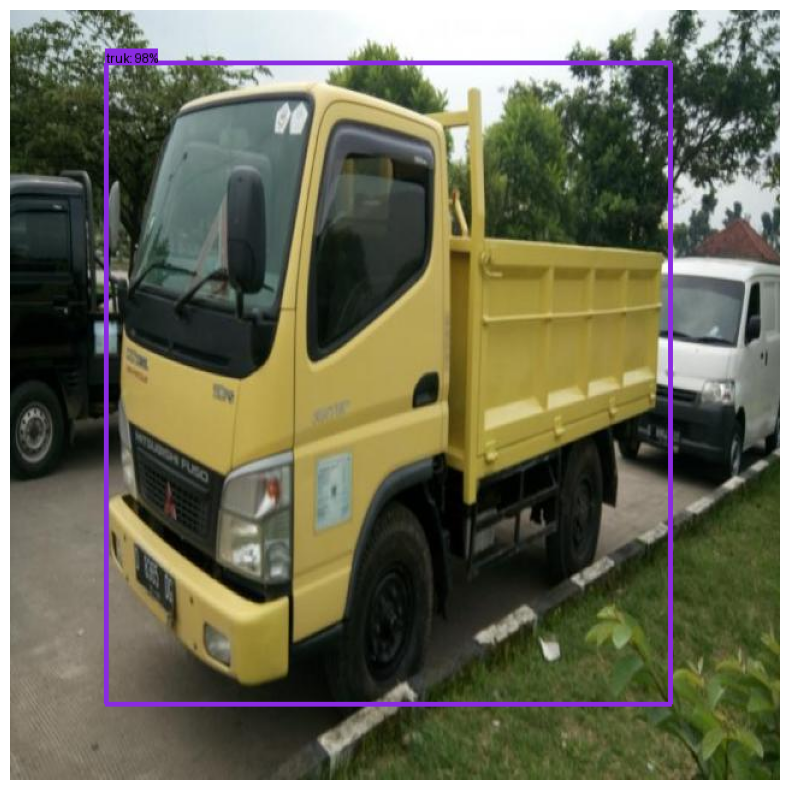

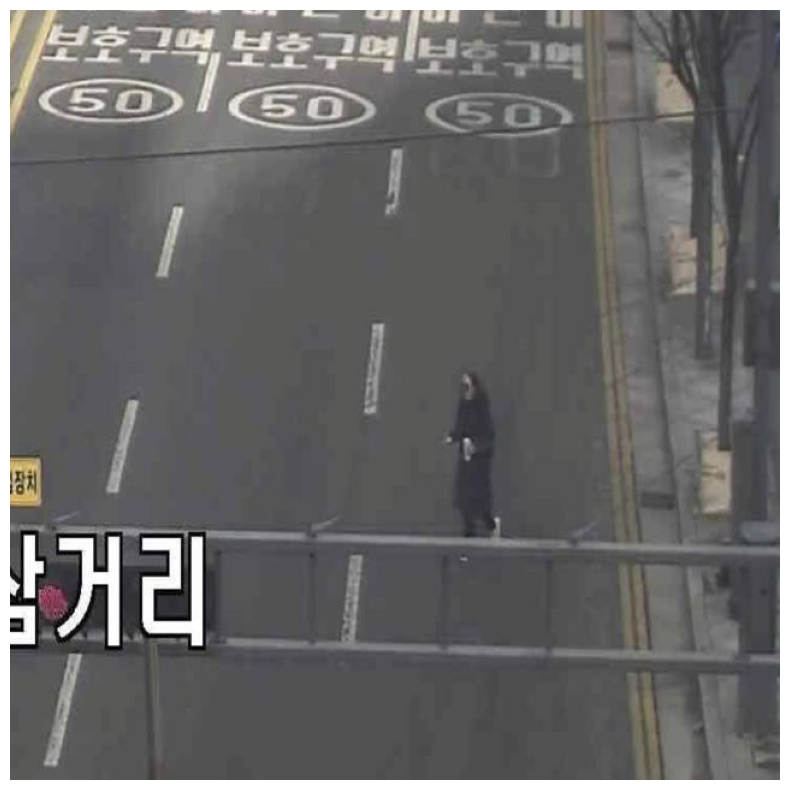

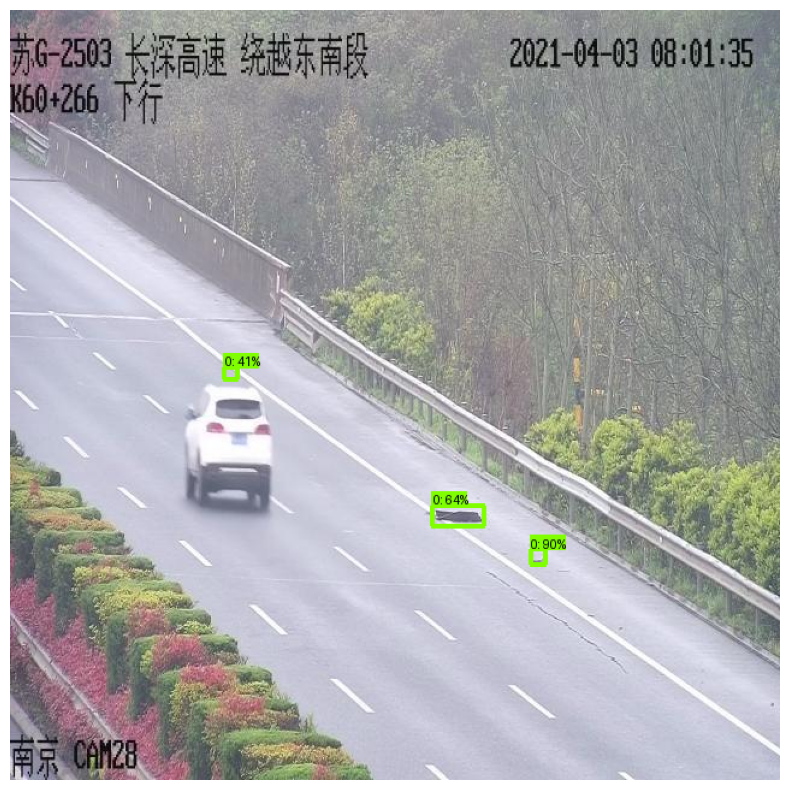

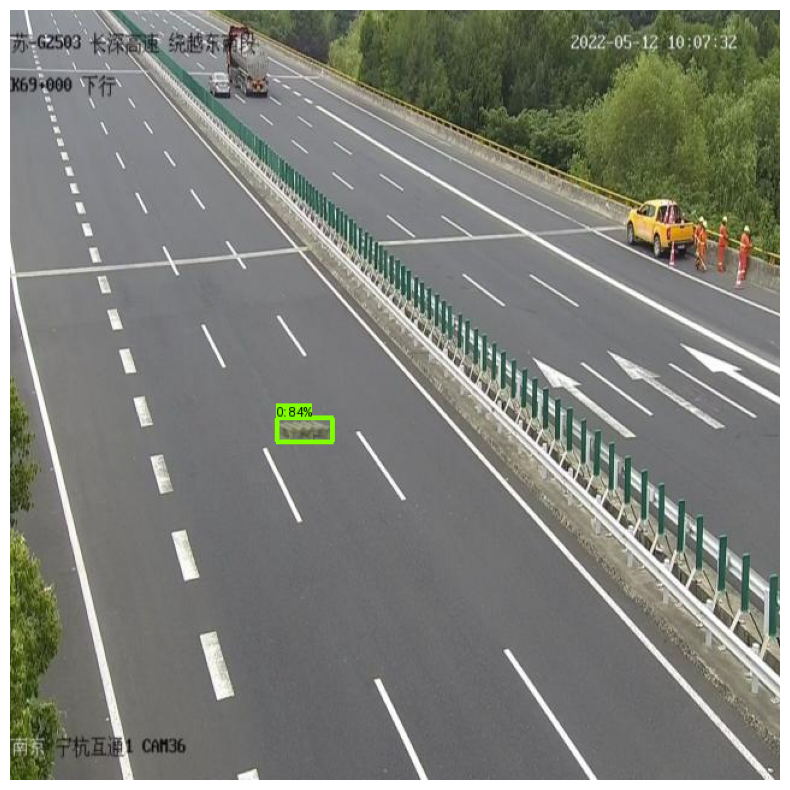

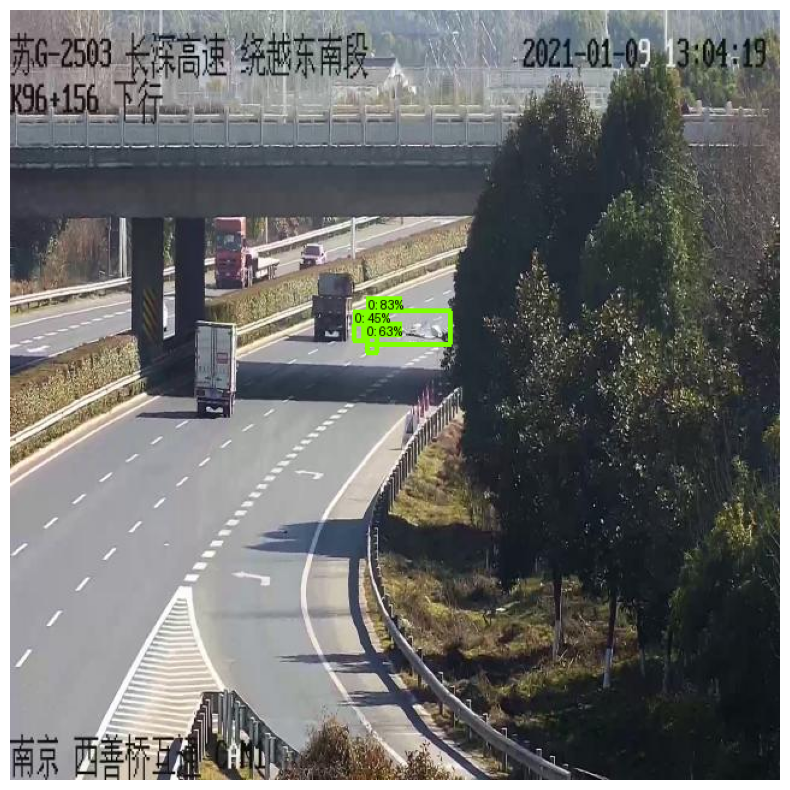

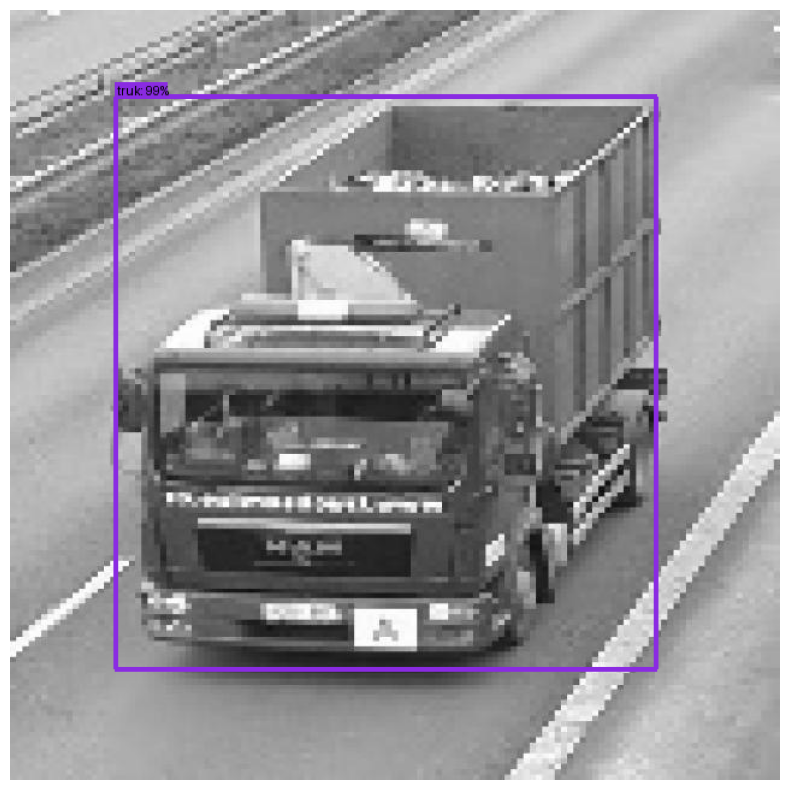

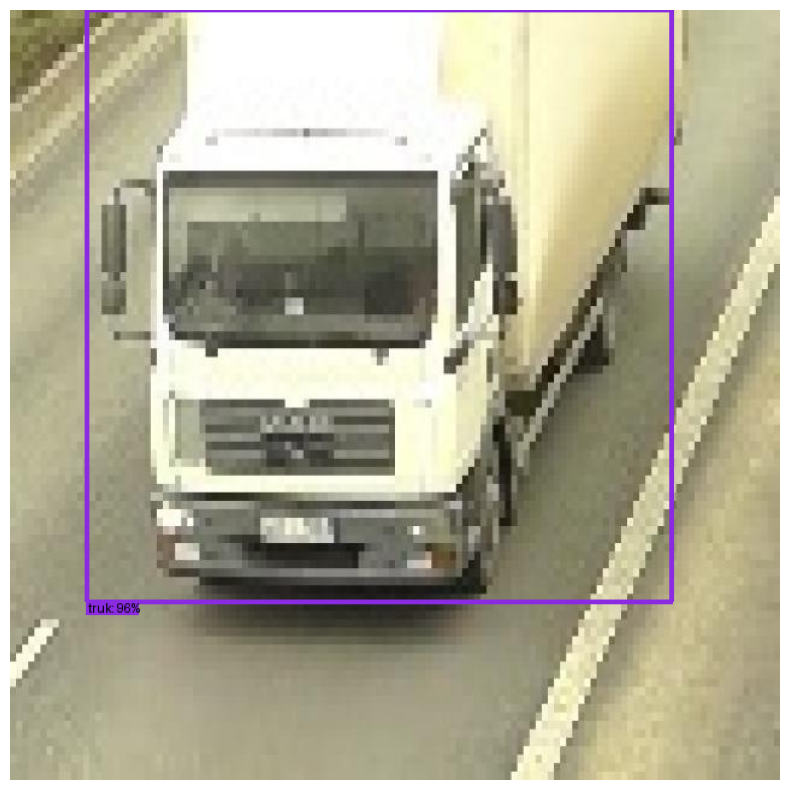

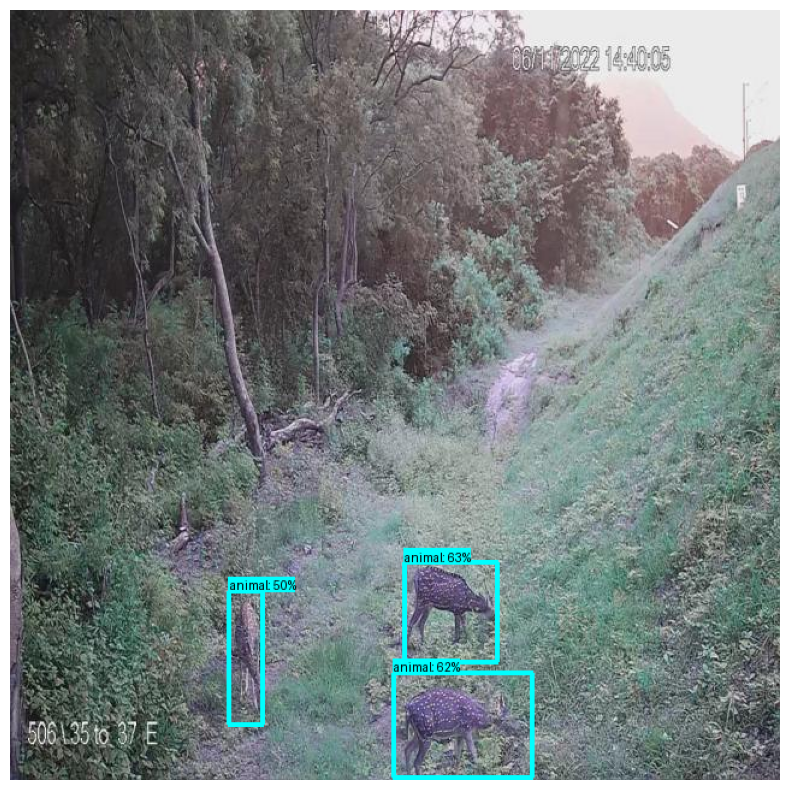

In [37]:
# List of image paths
image_paths = [
    '/content/extracted_test_images/25994-colt-fe-jual-truk-engkel-fe-71_jpg.rf.0204a33669487196240645aa25d180e6.jpg',
    '/content/extracted_test_images/-2024-10-06-060410_png.rf.02c5cf3437ebe7e9e4d4e353e8c6f32a.jpg',
    '/content/extracted_test_images/08388622-e5e1-4054-8262-100ca7469bd7_jpg.rf.0009e234f5d0906f3dd0210fc9d6a7bc.jpg',
    '/content/extracted_test_images/11YZD208TimeEnd1011322701266_jpg.rf.094e9229be081369bf16f677c18b1734.jpg',
    '/content/extracted_test_images/3f71b166-877a-46f8-9313-0443414a5d21_jpg.rf.023e576d35e7245c192d125d69b70939.jpg',
    '/content/extracted_test_images/Image_013283_jpg.rf.0a2b5ffdb8f8831cf6f8740c2d41b3e5.jpg',
    '/content/extracted_test_images/Image_013496_jpg.rf.00d06847fc3d8792ca0bff04178b3534.jpg',
    '/content/extracted_test_images/TAM-W-89-_jpg.rf.01cca3a2bc8b0f0f550ae6c0f2ac55de.jpg'

]

# Loop through each image and run inference
for image_path in image_paths:
    run_inference_and_show(image_path)



In [ ]:
import os
import io
import numpy as np
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
from object_detection.utils import visualization_utils as vis_util

# Output folder
output_dir = "/content/extracted_test_images"
os.makedirs(output_dir, exist_ok=True)

def run_model_on_roboflow_tfrecord(tfrecord_path, model, num_images=10):
    dataset = tf.data.TFRecordDataset(tfrecord_path)
    dataset = dataset.map(parse_tfrecord)

    for i, record in enumerate(dataset.take(num_images)):
        image_bytes = record['image/encoded'].numpy()
        image = Image.open(io.BytesIO(image_bytes)).convert("RGB")
        image_np = np.array(image)

        # Run inference
        input_tensor = tf.convert_to_tensor(image_np)[tf.newaxis, ...]
        detections = model(input_tensor)

        # Process results
        num_detections = int(detections.pop('num_detections'))
        detections = {k: v[0, :num_detections].numpy()
                      for k, v in detections.items()}
        detections['num_detections'] = num_detections
        detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

        # Visualization
        vis_util.visualize_boxes_and_labels_on_image_array(
            image_np,
            detections['detection_boxes'],
            detections['detection_classes'],
            detections['detection_scores'],
            category_index,
            use_normalized_coordinates=True,
            max_boxes_to_draw=10,
            min_score_thresh=0.3,
            agnostic_mode=False)

        # Save image with detections
        filename = record['image/filename'].numpy().decode('utf-8')
        save_path = os.path.join(output_dir, f"{i+1}_{filename}")
        Image.fromarray(image_np).save(save_path)
        print(f"✅ Saved: {save_path}")

        # Optional: Show the image
        plt.figure(figsize=(8, 8))
        plt.imshow(image_np)
        plt.axis('off')
        plt.title(filename)
        plt.show()


In [ ]:
import shutil

# Zip it
zip_path = "/content/tested_image_SSD_mobilenetv2.zip"
shutil.make_archive(zip_path.replace(".zip", ""), 'zip', output_dir)


'/content/tested_image_SSD_mobilenetv2.zip'

In [ ]:
from google.colab import files
files.download(zip_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Evaluation MAP

In [38]:
!python /content/models/research/object_detection/model_main_tf2.py \
  --pipeline_config_path="/content/models/mymodel/pipeline_file.config" \
  --model_dir="/content/training/" \
  --checkpoint_dir="/content/training/" \
  --run_once=True




2025-04-20 18:01:32.850257: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-04-20 18:01:32.850311: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-04-20 18:01:32.851940: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-20 18:01:34.039943: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
W0420 18:01:37.071044 134634573497472 model_lib_v2.py:1089] Forced number of epochs for all eval validations to be 1.
INFO:tensorflow:Maybe overwriting sample_1_of_n_eval_examples: None
I0420 18:01:37.071238 134634573497472 config_util.py:55

## tfexample_decoder.py

In [43]:
import os

output_dir = "/content/test_images"
os.makedirs(output_dir, exist_ok=True)


In [44]:
import tensorflow as tf
from PIL import Image
import io

# Define the features we want to extract
feature_description = {
    'image/encoded': tf.io.FixedLenFeature([], tf.string),
    'image/filename': tf.io.FixedLenFeature([], tf.string),
}

# Load the TFRecord
tfrecord_path = "/content/My-First-Project-1/test/objects.tfrecord"
raw_dataset = tf.data.TFRecordDataset(tfrecord_path)

# Parse and save each image
for i, raw_record in enumerate(raw_dataset):
    example = tf.io.parse_single_example(raw_record, feature_description)
    image_bytes = example['image/encoded'].numpy()
    filename = example['image/filename'].numpy().decode("utf-8")

    # Convert bytes to image
    image = Image.open(io.BytesIO(image_bytes))

    # Save the image
    image.save(os.path.join(output_dir, filename))

    if i % 10 == 0:
        print(f"Saved {i+1} images...")


Saved 1 images...
Saved 11 images...
Saved 21 images...
Saved 31 images...
Saved 41 images...
Saved 51 images...
Saved 61 images...
Saved 71 images...
Saved 81 images...
Saved 91 images...
Saved 101 images...
Saved 111 images...
Saved 121 images...
Saved 131 images...
Saved 141 images...
Saved 151 images...
Saved 161 images...
Saved 171 images...
Saved 181 images...
Saved 191 images...
Saved 201 images...
Saved 211 images...
Saved 221 images...
Saved 231 images...
Saved 241 images...
Saved 251 images...
Saved 261 images...
Saved 271 images...
Saved 281 images...
Saved 291 images...
Saved 301 images...
Saved 311 images...
Saved 321 images...
Saved 331 images...
Saved 341 images...
Saved 351 images...
Saved 361 images...
Saved 371 images...
Saved 381 images...
Saved 391 images...
Saved 401 images...
Saved 411 images...
Saved 421 images...
Saved 431 images...
Saved 441 images...
Saved 451 images...
Saved 461 images...
Saved 471 images...
Saved 481 images...
Saved 491 images...
Saved 501 i

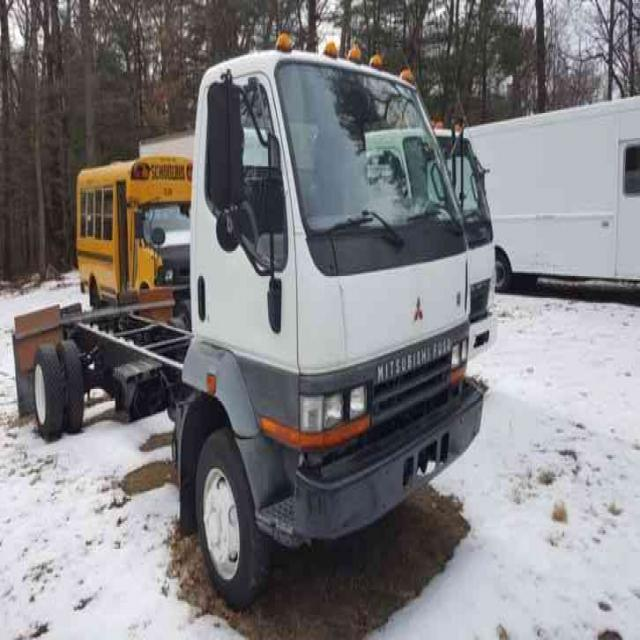

In [45]:
import os
from IPython.display import Image, display

sample_image_path = os.path.join(output_dir, os.listdir(output_dir)[0])
display(Image(filename=sample_image_path))


In [56]:
gt_dict = {}

raw_dataset = tf.data.TFRecordDataset(tfrecord_path)
feature_description = {
    'image/filename': tf.io.FixedLenFeature([], tf.string),
    'image/object/class/label': tf.io.VarLenFeature(tf.int64),
}

for raw_record in raw_dataset:
    example = tf.io.parse_single_example(raw_record, feature_description)
    filename = example['image/filename'].numpy().decode('utf-8')
    class_ids = tf.sparse.to_dense(example['image/object/class/label']).numpy()

    if len(class_ids) > 0:
        gt_dict[filename] = class_ids.tolist()


In [57]:
import numpy as np
from object_detection.utils import label_map_util
from PIL import Image

# Load model
detect_fn = tf.saved_model.load("/content/models/my_model/exported_model/saved_model")

# Load label map
label_map_path = "/content/My-First-Project-1/test/objects_label_map.pbtxt"
category_index = label_map_util.create_category_index_from_labelmap(label_map_path, use_display_name=True)

# Helper
def load_image_into_numpy_array(path):
    return np.array(Image.open(path))

# Run detection
pred_labels = []
gt_labels = []

for image_file in os.listdir(output_dir):
    if not image_file.endswith((".jpg", ".png")):
        continue

    if image_file not in gt_dict:
        continue

    image_path = os.path.join(output_dir, image_file)
    image_np = load_image_into_numpy_array(image_path)
    input_tensor = tf.convert_to_tensor(image_np)[tf.newaxis, ...]

    detections = detect_fn(input_tensor)
    pred_class_id = int(detections['detection_classes'][0][0].numpy())
    score = detections['detection_scores'][0][0].numpy()

    if score < 0.5:
        continue

    pred_labels.append(pred_class_id)
    gt_labels.append(gt_dict[image_file][0])  # Assumes 1 object per image


Accuracy: 0.902946273830156
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       223
      animal       0.98      1.00      0.99        47
       mobil       0.60      0.59      0.60        66
       motor       0.49      0.56      0.52        50
      person       1.00      0.60      0.75         5
        truk       1.00      0.97      0.99       186

    accuracy                           0.90       577
   macro avg       0.85      0.79      0.81       577
weighted avg       0.91      0.90      0.91       577



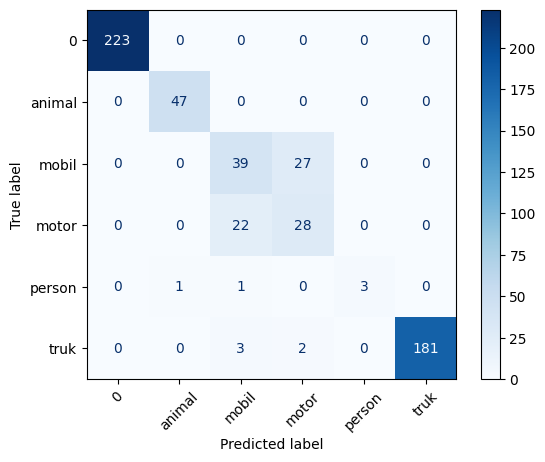

In [59]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, accuracy_score

# Accuracy
accuracy = accuracy_score(gt_labels, pred_labels)
print("Accuracy:", accuracy)

# Precision, Recall, F1
# Get only class IDs that are used
used_class_ids = sorted(set(gt_labels + pred_labels))

# Map class IDs to names
target_names = [category_index[c]['name'] for c in used_class_ids]

# Report
print(classification_report(gt_labels, pred_labels, target_names=target_names))


# Confusion Matrix

cm = confusion_matrix(gt_labels, pred_labels, labels=used_class_ids)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names)
disp.plot(cmap='Blues', xticks_rotation=45)

